In [156]:
#Import packages and libraries

In [157]:
pip install pandas-profiling

  Using cached joblib-1.1.1-py2.py3-none-any.whl.metadata (5.2 kB)
  Using cached visions-0.7.4-py3-none-any.whl.metadata (5.9 kB)
Using cached visions-0.7.4-py3-none-any.whl (102 kB)
Using cached joblib-1.1.1-py2.py3-none-any.whl (309 kB)

  Attempting uninstall: joblib

    Found existing installation: joblib 1.5.1

    Uninstalling joblib-1.5.1:

      Successfully uninstalled joblib-1.5.1

   ---------------------------------------- 0/2 [joblib]
   ---------------------------------------- 0/2 [joblib]
   ---------------------------------------- 0/2 [joblib]
   ---------------------------------------- 0/2 [joblib]
   ---------------------------------------- 0/2 [joblib]
   ---------------------------------------- 0/2 [joblib]
  Attempting uninstall: visions
   ---------------------------------------- 0/2 [joblib]
    Found existing installation: visions 0.8.1
   ---------------------------------------- 0/2 [joblib]
   -------------------- ------------------- 1/2 [visions]
    Uninst

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
scikit-learn 1.6.1 requires joblib>=1.2.0, but you have joblib 1.1.1 which is incompatible.
ydata-profiling 4.16.1 requires visions[type_image_path]<0.8.2,>=0.7.5, but you have visions 0.7.4 which is incompatible.


In [158]:
pip install yellowbrick

  Using cached joblib-1.5.1-py3-none-any.whl.metadata (5.6 kB)
Using cached joblib-1.5.1-py3-none-any.whl (307 kB)
  Attempting uninstall: joblib
    Found existing installation: joblib 1.1.1
    Uninstalling joblib-1.1.1:
      Successfully uninstalled joblib-1.1.1
Note: you may need to restart the kernel to use updated packages.


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pandas-profiling 3.2.0 requires joblib~=1.1.0, but you have joblib 1.5.1 which is incompatible.
ydata-profiling 4.16.1 requires visions[type_image_path]<0.8.2,>=0.7.5, but you have visions 0.7.4 which is incompatible.


In [159]:
pip install janitor

Note: you may need to restart the kernel to use updated packages.


In [160]:
import warnings
import gc
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)
%matplotlib inline

In [161]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn
import seaborn as sns
from ydata_profiling import ProfileReport   

import calendar
from seaborn import pairplot
from sklearn import ensemble, model_selection, preprocessing, tree
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import (
    train_test_split,
    StratifiedKFold,
    cross_val_score,
    cross_val_predict
)
from yellowbrick.classifier import ConfusionMatrix, ROCAUC
from yellowbrick.model_selection import LearningCurve
from imblearn.over_sampling import SMOTE, ADASYN
from seaborn import diverging_palette

# visualisation setup
%matplotlib inline
import matplotlib as mpl
mpl.rc("axes", labelsize=14)
mpl.rc("xtick", labelsize=12)
mpl.rc("ytick", labelsize=12)
from IPython.display import Image
from pandas.plotting import scatter_matrix


# Data Import and Profiling

In [162]:
sales = pd.read_csv("supermarket_sales.csv")

In [163]:
sales.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3


In [164]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Invoice ID               1000 non-null   object 
 1   Branch                   1000 non-null   object 
 2   City                     1000 non-null   object 
 3   Customer type            1000 non-null   object 
 4   Gender                   1000 non-null   object 
 5   Product line             1000 non-null   object 
 6   Unit price               1000 non-null   float64
 7   Quantity                 1000 non-null   int64  
 8   Tax 5%                   1000 non-null   float64
 9   Total                    1000 non-null   float64
 10  Date                     1000 non-null   object 
 11  Time                     1000 non-null   object 
 12  Payment                  1000 non-null   object 
 13  cogs                     1000 non-null   float64
 14  gross margin percentage  

In [165]:
sales.shape

In [166]:
sales.columns

Index(['Invoice ID', 'Branch', 'City', 'Customer type', 'Gender',
       'Product line', 'Unit price', 'Quantity', 'Tax 5%', 'Total', 'Date',
       'Time', 'Payment', 'cogs', 'gross margin percentage', 'gross income',
       'Rating'],
      dtype='object')

In [167]:
profile = ProfileReport(sales)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 17/17 [00:00<00:00, 41.11it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Data Exploration

Text(0, 0.5, 'Data type')

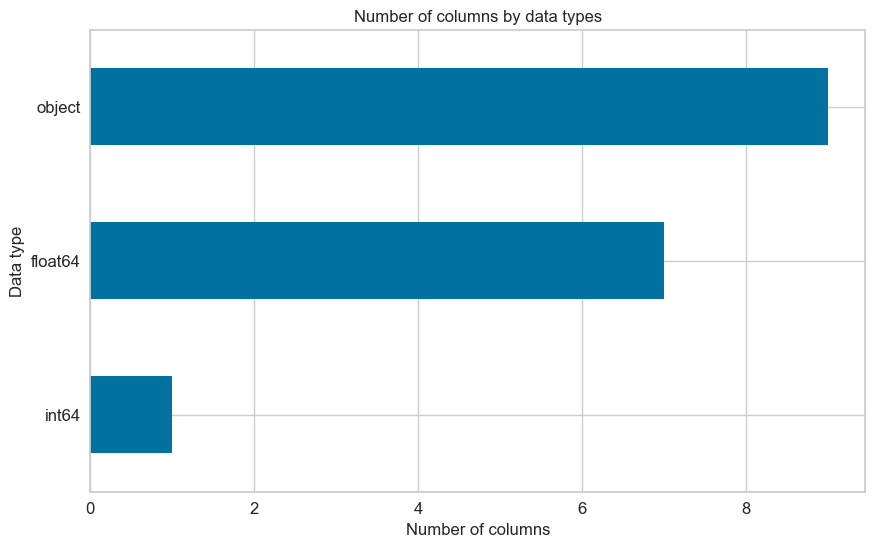

In [168]:
# Count of each type of column
sales.dtypes.value_counts().sort_values().plot(kind='barh',figsize=(10, 6),fontsize=12)
plt.title('Number of columns by data types', fontsize=12)
plt.xlabel('Number of columns', fontsize=12)
plt.ylabel('Data type', fontsize=12)

In [169]:
# Number of categories in each column
sales.select_dtypes('object').apply(pd.Series.nunique, axis=0)

Invoice ID       1000
Branch              3
City                3
Customer type       2
Gender              2
Product line        6
Date               89
Time              506
Payment             3
dtype: int64

In [170]:
# checking if the data is imbalanced and the distribution of categorical data

def vcounts(sales,colname):
    a = sales[colname].value_counts()
    return a



In [171]:
def vcounts(sales, colname, plot=False):
    counts = sales[colname].value_counts()
    if plot:
        counts.plot(kind='bar', title=f'Value Counts of {colname}')
    
    return counts

Product line
Fashion accessories       178
Food and beverages        174
Electronic accessories    170
Sports and travel         166
Home and lifestyle        160
Health and beauty         152
Name: count, dtype: int64

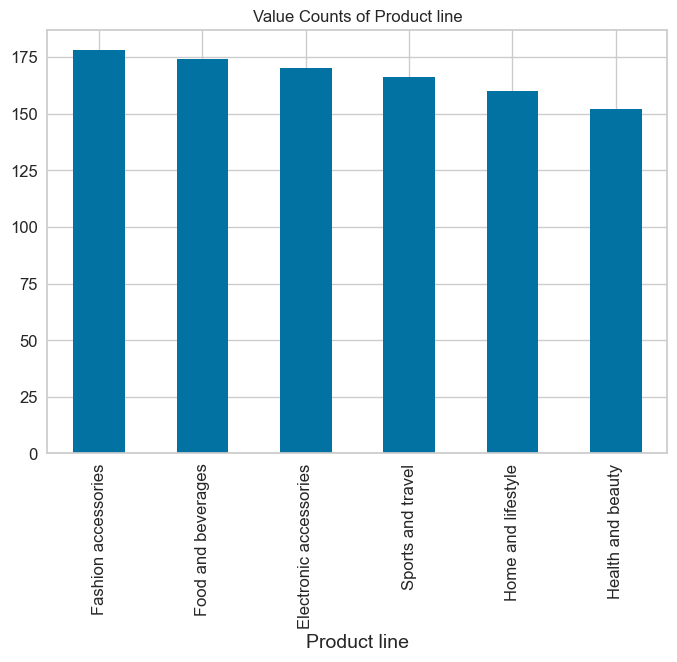

In [172]:
vcounts(sales, "Product line", plot=True)


In [173]:
vcounts(sales,"Branch")

Branch
A    340
B    332
C    328
Name: count, dtype: int64

In [174]:
vcounts(sales,"City")

City
Yangon       340
Mandalay     332
Naypyitaw    328
Name: count, dtype: int64

In [175]:
vcounts(sales,"Customer type")

Customer type
Member    501
Normal    499
Name: count, dtype: int64

In [176]:
vcounts(sales,"Gender")

Gender
Female    501
Male      499
Name: count, dtype: int64

In [177]:
vcounts(sales,"Product line")

Product line
Fashion accessories       178
Food and beverages        174
Electronic accessories    170
Sports and travel         166
Home and lifestyle        160
Health and beauty         152
Name: count, dtype: int64

In [178]:
vcounts(sales,"Payment")

Payment
Ewallet        345
Cash           344
Credit card    311
Name: count, dtype: int64

In [179]:
# dealing with date and time

sales['Date'] = pd.to_datetime(sales['Date'])

sales['Day'] = (sales['Date']).dt.day
sales['Month'] = (sales['Date']).dt.month

sales['Month'] = sales['Month'].apply(lambda x: calendar.month_name[x])

sales['Time'] = pd.to_datetime(sales['Time'])
sales['Hour'] = (sales['Time']).dt.hour

C:\Users\rithi\AppData\Local\Temp\ipykernel_26368\3295960908.py:10: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  sales['Time'] = pd.to_datetime(sales['Time'])


In [180]:
sales.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating,Day,Month,Hour
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,2019-01-05,2025-05-30 13:08:00,Ewallet,522.83,4.761905,26.1415,9.1,5,January,13
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,2019-03-08,2025-05-30 10:29:00,Cash,76.40,4.761905,3.8200,9.6,8,March,10
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,2019-03-03,2025-05-30 13:23:00,Credit card,324.31,4.761905,16.2155,7.4,3,March,13
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,2019-01-27,2025-05-30 20:33:00,Ewallet,465.76,4.761905,23.2880,8.4,27,January,20
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2019-02-08,2025-05-30 10:37:00,Ewallet,604.17,4.761905,30.2085,5.3,8,February,10


In [181]:
sales.describe()

,Unit price,Quantity,Tax 5%,Total,Date,Time,cogs,gross margin percentage,gross income,Rating,Day,Hour
count,1000.000000,1000.000000,1000.000000,1000.000000,1000,1000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000
mean,55.672130,5.510000,15.379369,322.966749,2019-02-14 00:05:45.600000,2025-05-30 15:24:41.880000,307.58738,4.761905,15.379369,6.97270,15.256000,14.910000
min,10.080000,1.000000,0.508500,10.678500,2019-01-01 00:00:00,2025-05-30 10:00:00,10.17000,4.761905,0.508500,4.00000,1.000000,10.000000
25%,32.875000,3.000000,5.924875,124.422375,2019-01-24 00:00:00,2025-05-30 12:43:00,118.49750,4.761905,5.924875,5.50000,8.000000,12.000000
50%,55.230000,5.000000,12.088000,253.848000,2019-02-13 00:00:00,2025-05-30 15:19:00,241.76000,4.761905,12.088000,7.00000,15.000000,15.000000
75%,77.935000,8.000000,22.445250,471.350250,2019-03-08 00:00:00,2025-05-30 18:15:00,448.90500,4.761905,22.445250,8.50000,23.000000,18.000000
max,99.960000,10.000000,49.650000,1042.650000,2019-03-30 00:00:00,2025-05-30 20:59:00,993.00000,4.761905,49.650000,10.00000,31.000000,20.000000
std,26.494628,2.923431,11.708825,245.885335,NaN,NaN,234.17651,0.000000,11.708825,1.71858,8.693563,3.186857


In [182]:
sales.mean(numeric_only=True)

Unit price                  55.672130
Quantity                     5.510000
Tax 5%                      15.379369
Total                      322.966749
cogs                       307.587380
gross margin percentage      4.761905
gross income                15.379369
Rating                       6.972700
Day                         15.256000
Hour                        14.910000
dtype: float64

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating,Day,Hour
Unit price,1.000000,0.010778,0.633962,0.633962,0.633962,NaN,0.633962,-0.008778,0.057021,0.008242
Quantity,0.010778,1.000000,0.705510,0.705510,0.705510,NaN,0.705510,-0.015815,-0.043347,-0.007317
Tax 5%,0.633962,0.705510,1.000000,1.000000,1.000000,NaN,1.000000,-0.036442,-0.002515,-0.002770
Total,0.633962,0.705510,1.000000,1.000000,1.000000,NaN,1.000000,-0.036442,-0.002515,-0.002770
cogs,0.633962,0.705510,1.000000,1.000000,1.000000,NaN,1.000000,-0.036442,-0.002515,-0.002770
gross margin percentage,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gross income,0.633962,0.705510,1.000000,1.000000,1.000000,NaN,1.000000,-0.036442,-0.002515,-0.002770
Rating,-0.008778,-0.015815,-0.036442,-0.036442,-0.036442,NaN,-0.036442,1.000000,-0.007076,-0.030588
Day,0.057021,-0.043347,-0.002515,-0.002515,-0.002515,NaN,-0.002515,-0.007076,1.000000,0.020668
Hour,0.008242,-0.007317,-0.002770,-0.002770,-0.002770,NaN,-0.002770,-0.030588,0.020668,1.000000


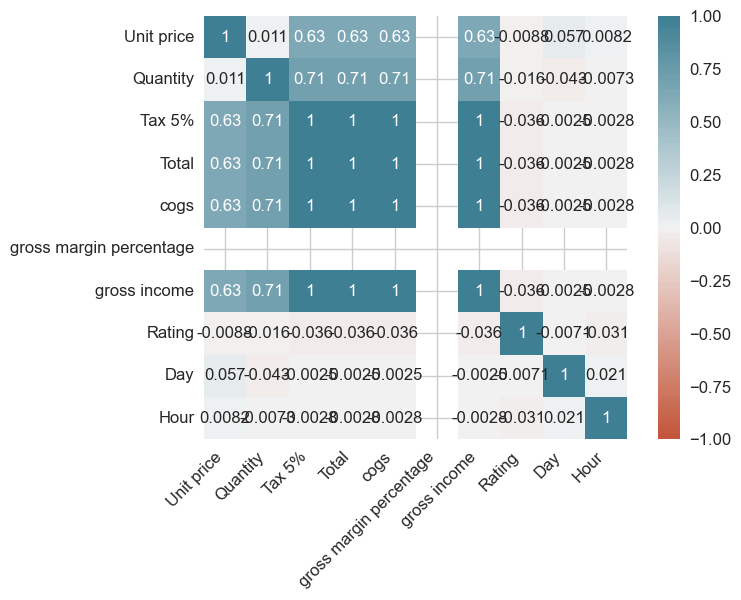

In [183]:
#checking correlations

numeric_sales = sales.select_dtypes(include='number')
data_corr = numeric_sales.corr()

ax = sns.heatmap(
   data_corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),square=True,annot=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)

data_corr

TOTAL COORELATION

In [184]:
data_corr["Total"].sort_values(ascending=False)

Total                      1.000000
Tax 5%                     1.000000
gross income               1.000000
cogs                       1.000000
Quantity                   0.705510
Unit price                 0.633962
Day                       -0.002515
Hour                      -0.002770
Rating                    -0.036442
gross margin percentage         NaN
Name: Total, dtype: float64

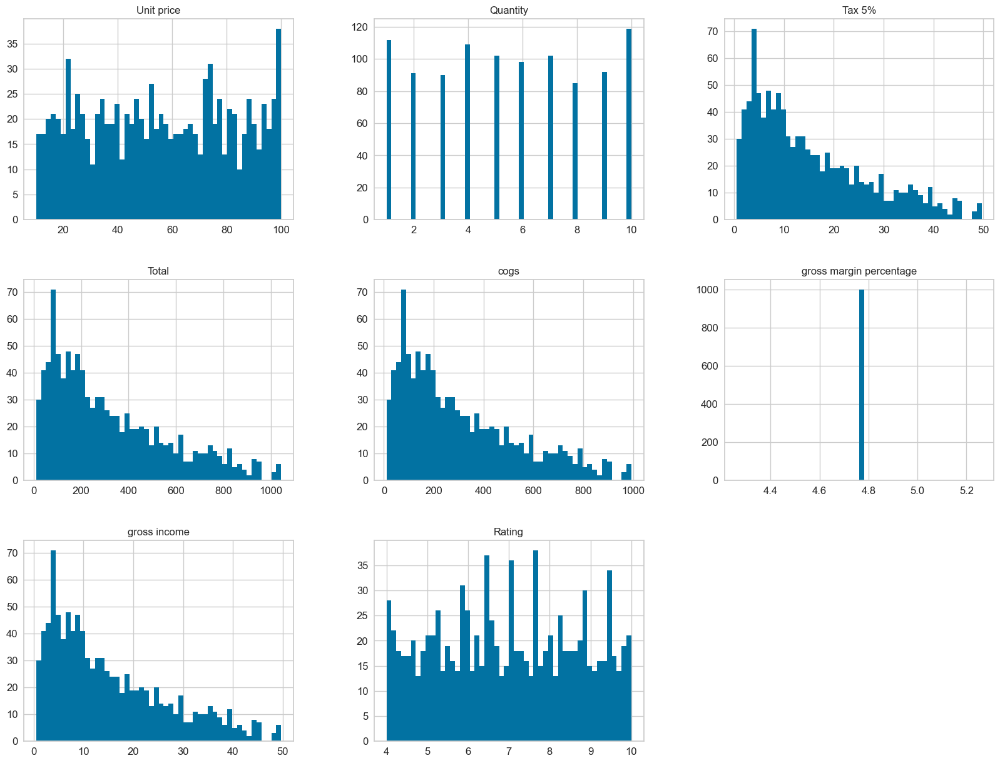

In [185]:
#histograms of continuous variables
attributes = ["Unit price","Quantity","Tax 5%","Total","cogs","gross margin percentage","gross income","Rating"]
%matplotlib inline
import matplotlib.pyplot as plt
sales[attributes].hist(bins=50, figsize=(20,15))
plt.show()

In [186]:
sales.dtypes

Invoice ID                         object
Branch                             object
City                               object
Customer type                      object
Gender                             object
Product line                       object
Unit price                        float64
Quantity                            int64
Tax 5%                            float64
Total                             float64
Date                       datetime64[ns]
Time                       datetime64[ns]
Payment                            object
cogs                              float64
gross margin percentage           float64
gross income                      float64
Rating                            float64
Day                                 int32
Month                              object
Hour                                int32
dtype: object

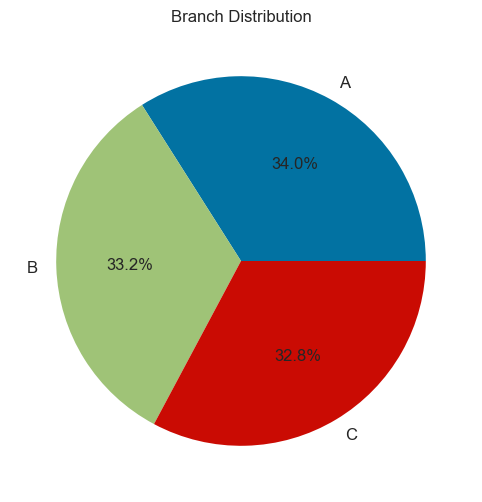

In [187]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))

# Ensure correct column names
branch = sales.Branch.value_counts().reset_index()
branch.columns = ['Branch', 'Count']  # Rename columns explicitly

# Use the correct column names
plt.pie(branch['Count'], labels=branch['Branch'], autopct='%1.1f%%')
plt.title("Branch Distribution")
plt.show()

*From the distribution it is clearly observed that the supermarket has maximum number of branch A as compared to B and C.*

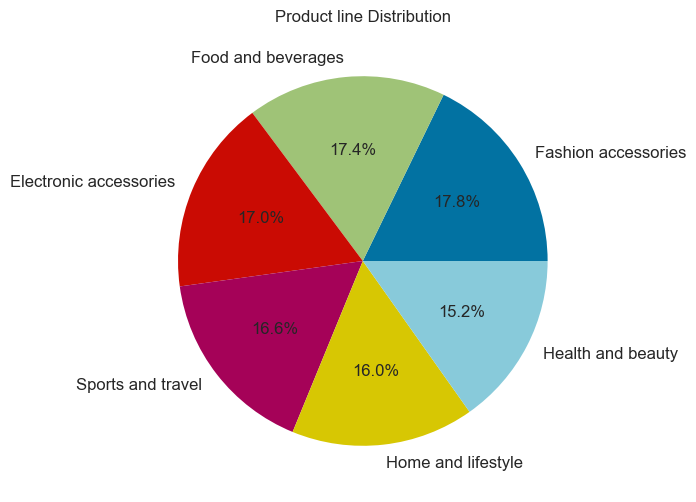

In [188]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))

# Ensure correct column names
productline = sales["Product line"].value_counts().reset_index()
productline.columns = ['Product line', 'Count']  # Rename columns explicitly

# Use the correct column names
plt.pie(productline['Count'], labels=productline['Product line'], autopct='%1.1f%%')
plt.title("Product line Distribution")
plt.show()

*From the pie chart it was observed that fashion accessories were the most popular product in all the branches, food and beverages stands second and electronic accessories comes third in the product category*

<Axes: xlabel='Gender'>

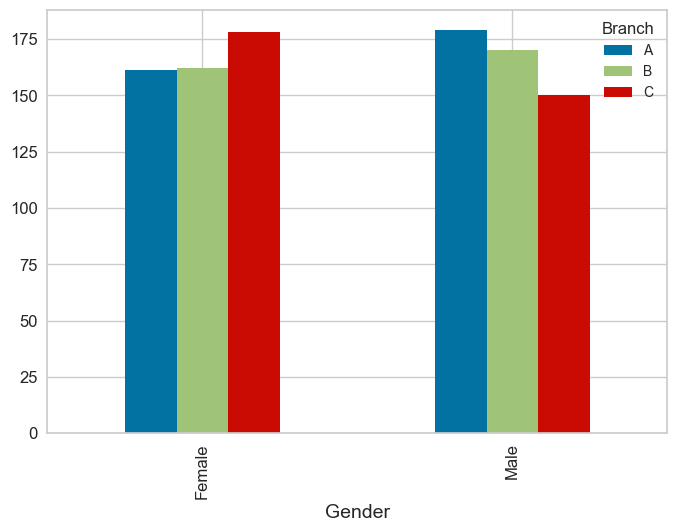

In [189]:
#Distribution of Gender across branches
sales.groupby(['Branch','Gender']).size().unstack(0).plot.bar()

*Higher number of females buy products from Branch C as compared to males who buy most of the products from Branch A and B. This implies that Branch C is more popular among females and Branch A and B are more popular among males.*

Text(0.5, 1.0, 'Ratings by Branch')

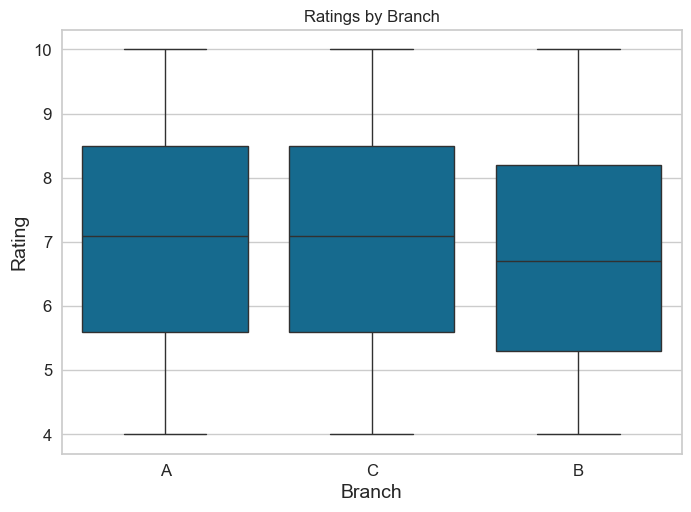

In [190]:
#Ratings of the branches
sns.boxplot(x="Branch", y ="Rating" ,data =sales).set_title("Ratings by Branch")

*Branch B has the lowest rating among all other branches and Branch A and C have equal rating*

<Axes: xlabel='Customer type'>

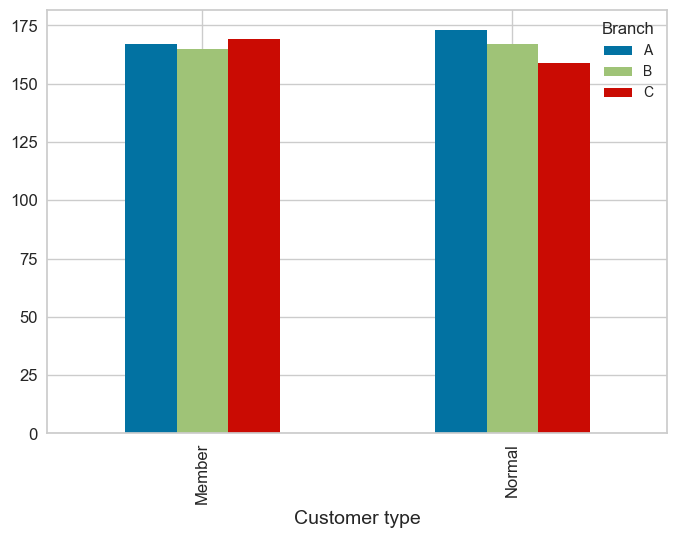

In [191]:
#Distribution of Customer type across branches

sales.groupby(['Branch','Customer type']).size().unstack(0).plot.bar()

*The Member customers buy most of their products from Branch C and least from Branch B whereas Normal customers purchase heavily from Branch A and then B but least from Branch C*

<Axes: xlabel='count', ylabel='Product line'>

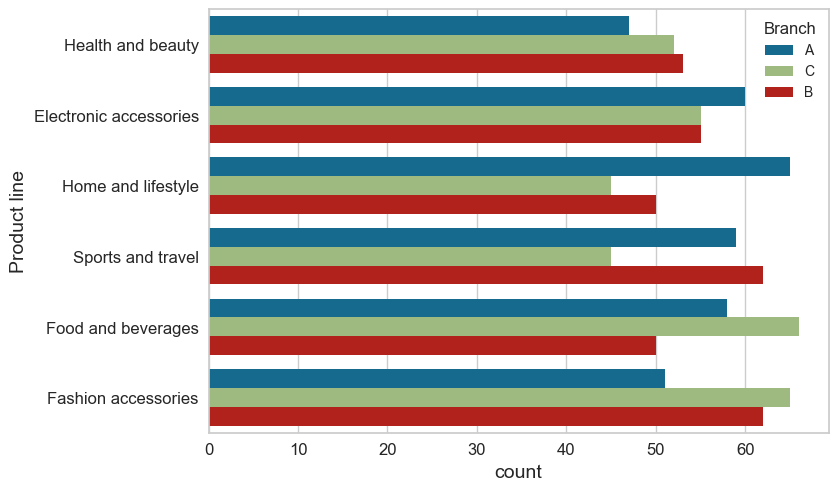

In [192]:
# sales of different product lines in different branches

sns.countplot(y='Product line',hue='Branch',data=sales)

*From the barplot we can observe that in Branch A, Home and lifestyle items are sold the most. In Branch B, Sports and travel and Fashion accessories are mostly sold whereas in Branch C, Food Beverages and Fashion accessories are maximum sold*

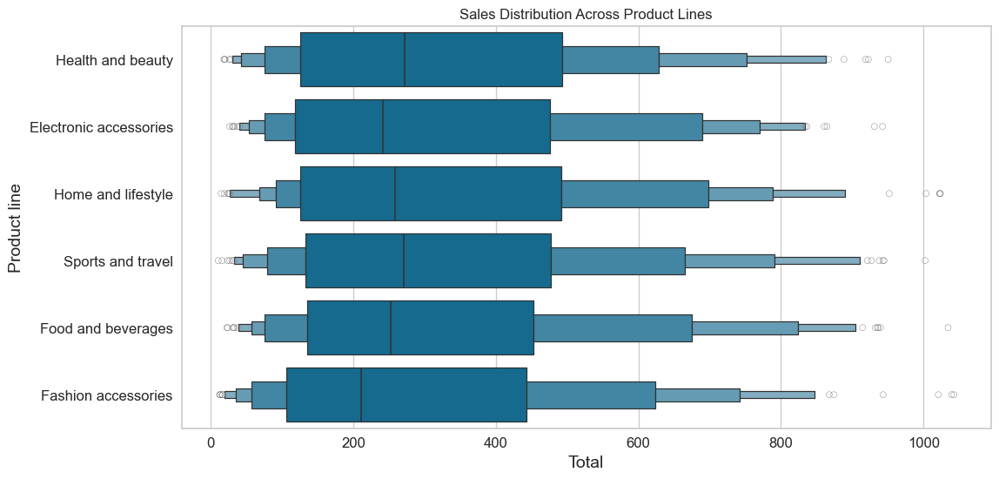

In [193]:
#Sales of different products
sales['Total'] = pd.to_numeric(sales['Total'], errors='coerce')

# Create the boxen plot
plt.figure(figsize=(12,6))
sns.boxenplot(y='Product line', x='Total', data=sales)
plt.title("Sales Distribution Across Product Lines")
plt.show()


*From the above visual, Health and Beauty,Sports and travel generate more total sales than Electronic accessories, Home and lifestyle, food and beverages and fashion accessories.*

<Axes: xlabel='Rating', ylabel='Product line'>

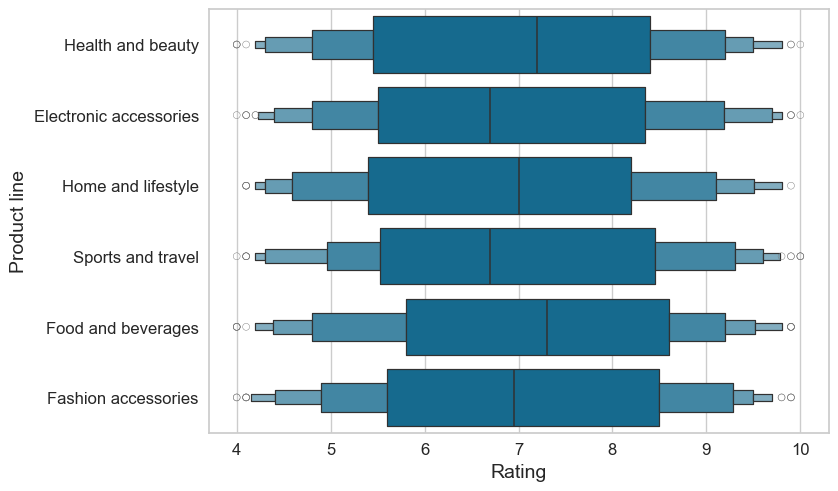

In [194]:
#ratings of the products
sns.boxenplot(y = 'Product line', x = 'Rating', data=sales )

Health and Beauty and food and beverages have higher rating as compared to other products. 

<Axes: xlabel='Quantity', ylabel='Product line'>

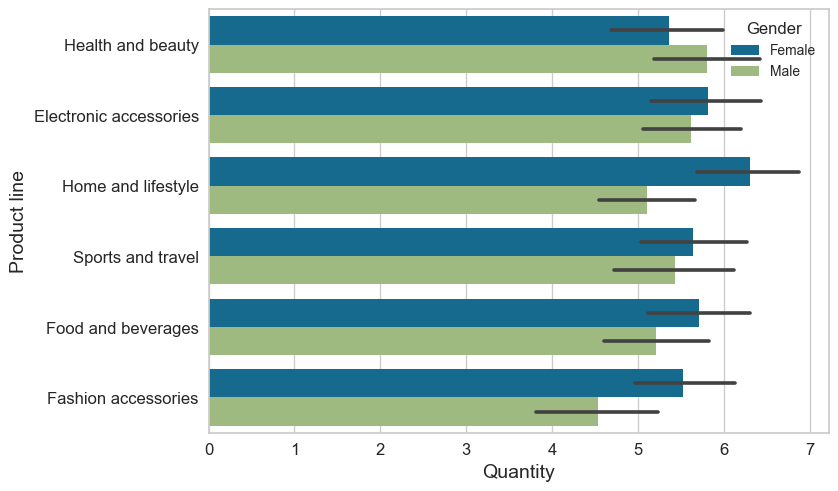

In [195]:
#Quantity of products segregated by Gender
sns.barplot(x='Quantity',hue='Gender',y = 'Product line',data=sales)

*As observed previously in total sales, Females prefer to shop for Home and lifestyle items and that is why they purchase maximum quantity(6.3) of this product whereas males are more inclined to shop for Health and beauty products and they purchased maximum quantity of around 5.7*

<Axes: xlabel='Quantity', ylabel='Product line'>

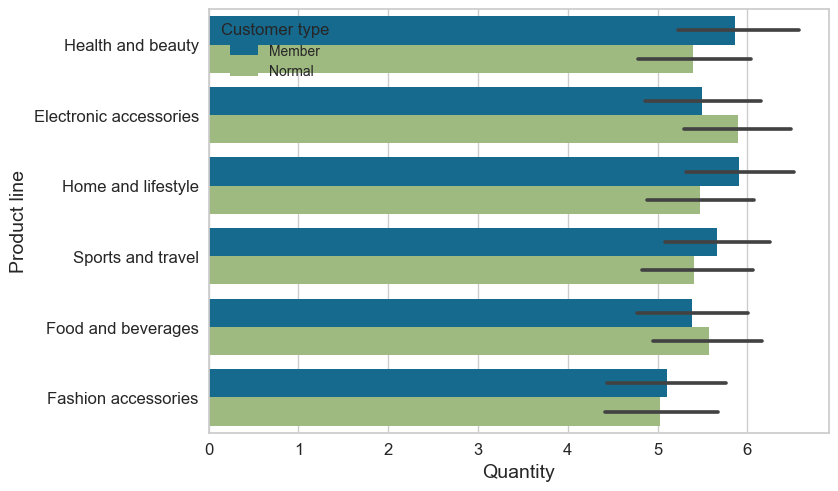

In [196]:
#Quantity of products segregated by Customer Type

sns.barplot(x='Quantity',hue='Customer type',y = 'Product line',data=sales)

*Members prefer to buy more quantity of health and beauty products and home and lifestyle products whereas Normal customers prefer electronic accessories*

<Axes: xlabel='Total', ylabel='Product line'>

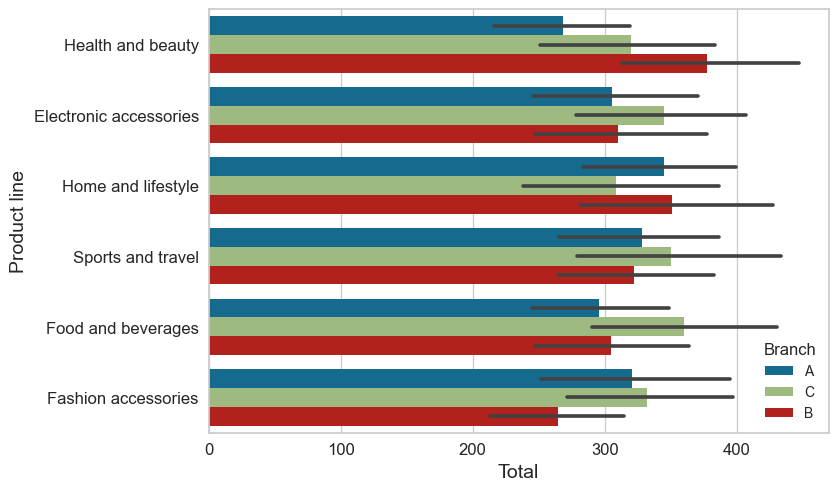

In [197]:
#Total sales of products per branch
sns.barplot(x='Total',hue='Branch',y = 'Product line',data=sales)

*In Branch A the maximum sales are generated by home and lifestyle products, in Branch B, Health and beauty products generates the maximum sales and in Branch C food and beverages generated maximum sales*

<Axes: xlabel='Gender', ylabel='Total'>

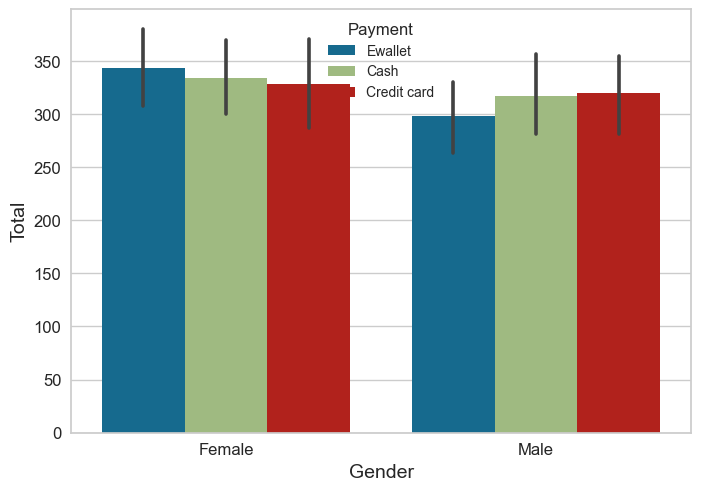

In [198]:
#Sales generated by Gender through payment types
sns.barplot(y='Total',hue='Payment',x = 'Gender',data=sales)

*Females prefer to purchase itmes using e-wallet and generate maximum sales of about 348 dollars whereas males prefer to shop by credit cards and generate maximim sales of about 330 dollars*

Text(0.5, 1.0, 'Hourly sales')

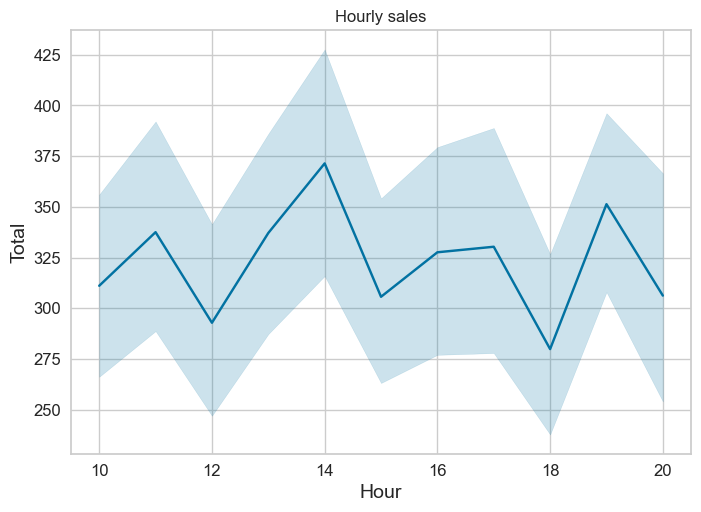

In [199]:
#Hourly Sales

sns.lineplot(x="Hour",  y = 'Total',data =sales).set_title("Hourly sales")

Text(0.5, 1.0, 'Hourly Quantity')

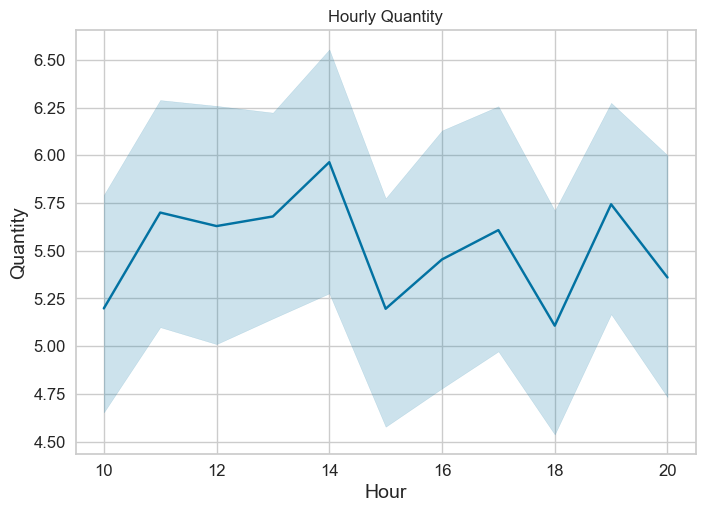

In [200]:
#Hourly Quantity
sns.lineplot(x="Hour",  y = 'Quantity',data =sales).set_title("Hourly Quantity")

*Most of the items were sold around 14:00 hrs local time*

Text(0.5, 1.0, 'Daily sales')

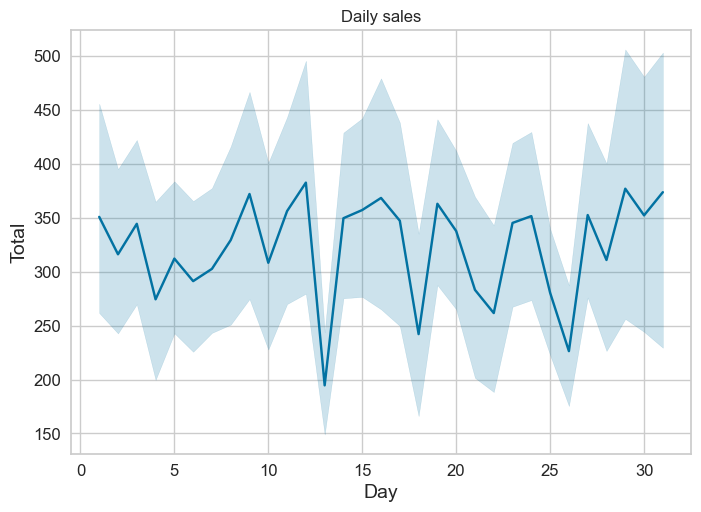

In [201]:
#Daily Sales
sns.lineplot(x="Day",  y = 'Total',data =sales).set_title("Daily sales")

Text(0.5, 1.0, 'Daily Quantity')

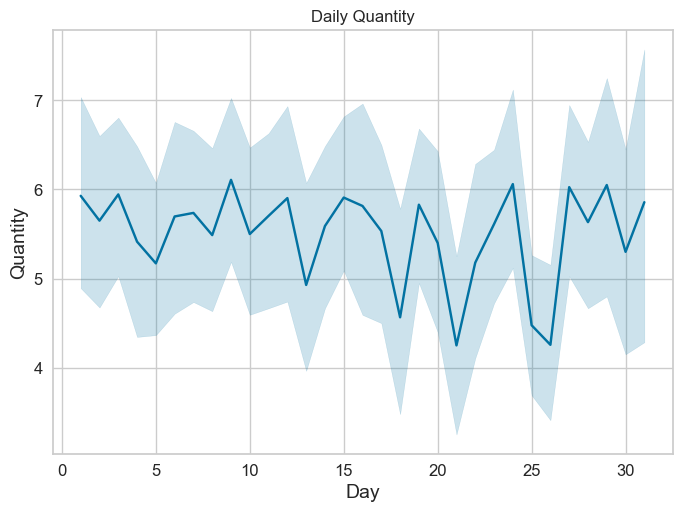

In [202]:
#Daily Quantity

sns.lineplot(x="Day",  y = 'Quantity',data =sales).set_title("Daily Quantity")

*Most of the sale sare generates in around 28 days*

Text(0.5, 1.0, 'Monthly sales')

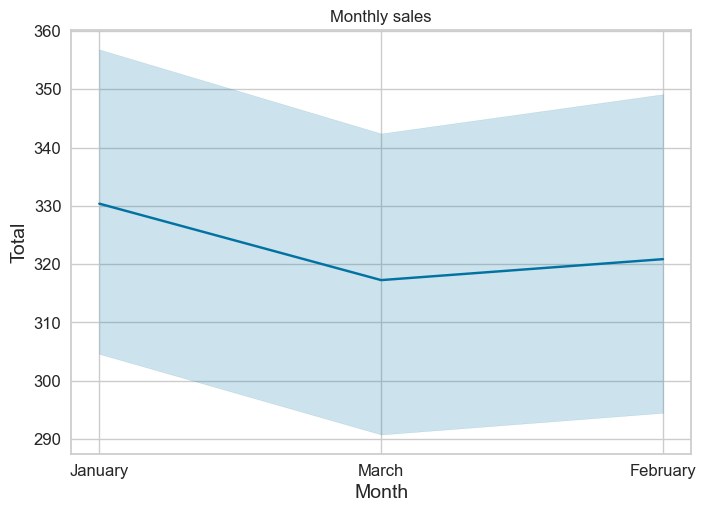

In [203]:
#Monthly Sales
sns.lineplot(x="Month",  y = 'Total',data =sales).set_title("Monthly sales")

Text(0.5, 1.0, 'Monthly Quantity')

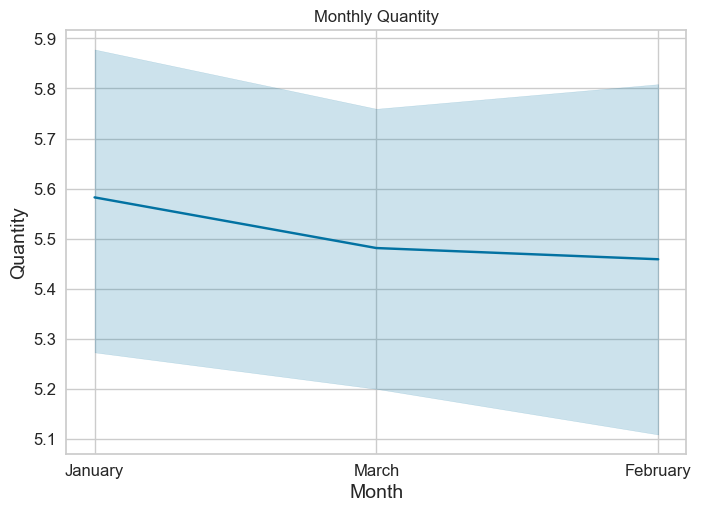

In [204]:
#Monthly Quantity
sns.lineplot(x="Month",  y = 'Quantity',data =sales).set_title("Monthly Quantity")

Maximum sales are generated in the month of January with a big drop in March.

# Data Preparation

In [205]:
# Removing variables from the data which don't have any predictive

sales_clean = sales.drop(columns=["Invoice ID","Date","Time","gross margin percentage"])

In [206]:
sales_clean.head()

,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Payment,cogs,gross income,Rating,Day,Month,Hour
0,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,Ewallet,522.83,26.1415,9.1,5,January,13
1,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,Cash,76.40,3.8200,9.6,8,March,10
2,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,Credit card,324.31,16.2155,7.4,3,March,13
3,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,Ewallet,465.76,23.2880,8.4,27,January,20
4,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,Ewallet,604.17,30.2085,5.3,8,February,10


In [207]:
sales_clean.dtypes

Branch            object
City              object
Customer type     object
Gender            object
Product line      object
Unit price       float64
Quantity           int64
Tax 5%           float64
Total            float64
Payment           object
cogs             float64
gross income     float64
Rating           float64
Day                int32
Month             object
Hour               int32
dtype: object

In [208]:
#Splitting Features into binary, numeric and categorical

binary_feature = sales_clean.nunique()[sales_clean.nunique() == 2].keys().tolist()

In [209]:
binary_feature

['Customer type', 'Gender']

In [210]:
numeric_feat = sales_clean.drop(columns = ["Branch","City","Customer type","Gender","Product line","Payment","Month"])

In [211]:
numeric_feat.columns

Index(['Unit price', 'Quantity', 'Tax 5%', 'Total', 'cogs', 'gross income',
       'Rating', 'Day', 'Hour'],
      dtype='object')

In [212]:
cat_feat = sales_clean[["Branch","City","Customer type","Gender","Product line","Payment","Month"]]

In [213]:
cat_feat.columns

Index(['Branch', 'City', 'Customer type', 'Gender', 'Product line', 'Payment',
       'Month'],
      dtype='object')

In [214]:
# Feature Engineering by dummyfying the binary and categorical variables
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in binary_feature:
    sales_clean[i] = le.fit_transform(sales_clean[i])

In [215]:
#One-hot encoding the rest of categorical columns\
sales_clean = pd.get_dummies(sales_clean)

In [216]:
sales_clean.head()

,Customer type,Gender,Unit price,Quantity,Tax 5%,Total,cogs,gross income,Rating,Day,...,Product line_Food and beverages,Product line_Health and beauty,Product line_Home and lifestyle,Product line_Sports and travel,Payment_Cash,Payment_Credit card,Payment_Ewallet,Month_February,Month_January,Month_March
0,0,0,74.69,7,26.1415,548.9715,522.83,26.1415,9.1,5,...,False,True,False,False,False,False,True,False,True,False
1,1,0,15.28,5,3.8200,80.2200,76.40,3.8200,9.6,8,...,False,False,False,False,True,False,False,False,False,True
2,1,1,46.33,7,16.2155,340.5255,324.31,16.2155,7.4,3,...,False,False,True,False,False,True,False,False,False,True
3,0,1,58.22,8,23.2880,489.0480,465.76,23.2880,8.4,27,...,False,True,False,False,False,False,True,False,True,False
4,1,1,86.31,7,30.2085,634.3785,604.17,30.2085,5.3,8,...,False,False,False,True,False,False,True,True,False,False


,Customer type,Gender,Unit price,Quantity,Tax 5%,Total,cogs,gross income,Rating,Day,...,Product line_Food and beverages,Product line_Health and beauty,Product line_Home and lifestyle,Product line_Sports and travel,Payment_Cash,Payment_Credit card,Payment_Ewallet,Month_February,Month_January,Month_March
Customer type,1.000000,0.039996,-0.020238,-0.016763,-0.019670,-0.019670,-0.019670,-0.019670,0.018889,0.034124,...,-0.036011,0.017559,-0.015494,-0.020608,0.018289,-0.069946,0.049835,-0.048730,0.018225,0.028799
Gender,0.039996,1.000000,0.015445,-0.074258,-0.049451,-0.049451,-0.049451,-0.049451,0.004800,0.051157,...,-0.014909,0.067695,0.006328,-0.025984,-0.023813,-0.031061,0.054042,-0.053082,0.001474,0.049835
Unit price,-0.020238,0.015445,1.000000,0.010778,0.633962,0.633962,0.633962,0.633962,-0.008778,0.057021,...,0.005836,-0.013072,-0.005854,0.022257,0.029721,-0.032415,0.001865,0.023901,0.012437,-0.035601
Quantity,-0.016763,-0.074258,0.010778,1.000000,0.705510,0.705510,0.705510,0.705510,-0.015815,-0.043347,...,-0.006084,0.015709,0.027446,0.004912,0.000403,0.006203,-0.006443,-0.011565,0.018258,-0.007163
Tax 5%,-0.019670,-0.049451,0.633962,0.705510,1.000000,1.000000,1.000000,1.000000,-0.036442,-0.002515,...,-0.000551,0.001165,0.024276,0.016517,0.009474,0.002852,-0.012244,-0.005663,0.022216,-0.016846
Total,-0.019670,-0.049451,0.633962,0.705510,1.000000,1.000000,1.000000,1.000000,-0.036442,-0.002515,...,-0.000551,0.001165,0.024276,0.016517,0.009474,0.002852,-0.012244,-0.005663,0.022216,-0.016846
cogs,-0.019670,-0.049451,0.633962,0.705510,1.000000,1.000000,1.000000,1.000000,-0.036442,-0.002515,...,-0.000551,0.001165,0.024276,0.016517,0.009474,0.002852,-0.012244,-0.005663,0.022216,-0.016846
gross income,-0.019670,-0.049451,0.633962,0.705510,1.000000,1.000000,1.000000,1.000000,-0.036442,-0.002515,...,-0.000551,0.001165,0.024276,0.016517,0.009474,0.002852,-0.012244,-0.005663,0.022216,-0.016846
Rating,0.018889,0.004800,-0.008778,-0.015815,-0.036442,-0.036442,-0.036442,-0.036442,1.000000,-0.007076,...,0.037546,0.007540,-0.034351,-0.014658,-0.001114,0.011935,-0.010509,0.037842,0.019271,-0.055945
Day,0.034124,0.051157,0.057021,-0.043347,-0.002515,-0.002515,-0.002515,-0.002515,-0.007076,1.000000,...,-0.002897,0.017338,-0.048331,-0.017784,0.021304,-0.035954,0.013722,-0.105823,0.154916,-0.053339


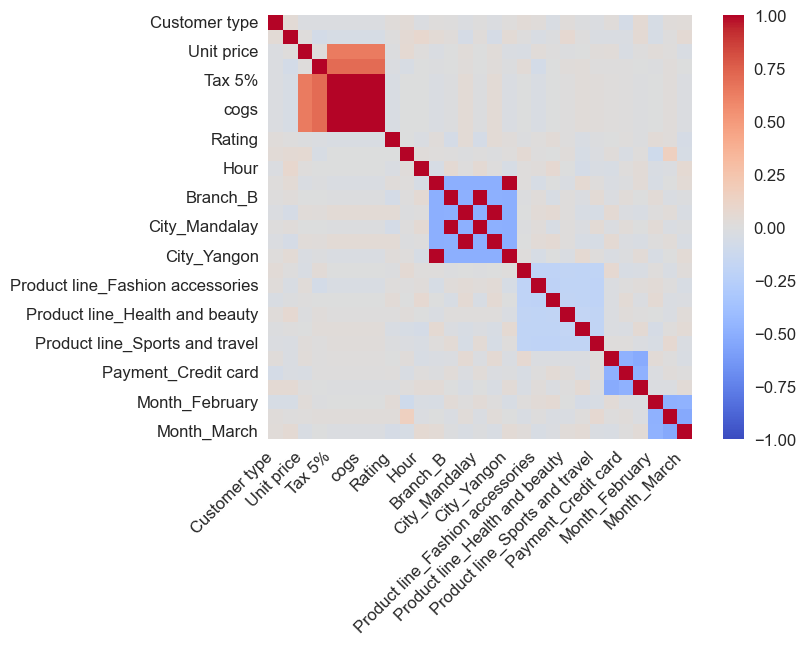

In [217]:
# detecting correlations between variables
data_corr2 = sales_clean.corr()

ax = sns.heatmap(
   data_corr2, 
    vmin=-1, vmax=1, center=0,
    cmap = "coolwarm",square=True,
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

data_corr2

In [218]:
data_corr2["Total"].sort_values(ascending=True)

Gender                                -0.049451
Rating                                -0.036442
Product line_Fashion accessories      -0.033850
City_Yangon                           -0.030994
Branch_A                              -0.030994
Customer type                         -0.019670
Month_March                           -0.016846
Payment_Ewallet                       -0.012244
City_Mandalay                         -0.008876
Branch_B                              -0.008876
Product line_Electronic accessories   -0.006140
Month_February                        -0.005663
Hour                                  -0.002770
Day                                   -0.002515
Product line_Food and beverages       -0.000551
Product line_Health and beauty         0.001165
Payment_Credit card                    0.002852
Payment_Cash                           0.009474
Product line_Sports and travel         0.016517
Month_January                          0.022216
Product line_Home and lifestyle        0

In [219]:
# removing highly correlated variables

sales_clean = sales_clean.drop(columns = ["Tax 5%","cogs","gross income","City_Mandalay","City_Naypyitaw","City_Yangon"])

In [220]:
sales_clean.columns

Index(['Customer type', 'Gender', 'Unit price', 'Quantity', 'Total', 'Rating',
       'Day', 'Hour', 'Branch_A', 'Branch_B', 'Branch_C',
       'Product line_Electronic accessories',
       'Product line_Fashion accessories', 'Product line_Food and beverages',
       'Product line_Health and beauty', 'Product line_Home and lifestyle',
       'Product line_Sports and travel', 'Payment_Cash', 'Payment_Credit card',
       'Payment_Ewallet', 'Month_February', 'Month_January', 'Month_March'],
      dtype='object')

# Training&Testing,Tuning and Building Model

In [221]:
# Creating X and Y variables
X = sales_clean.drop(columns=["Total"])
y = sales_clean["Total"]

In [222]:
#Splitting dataset into training and testing

from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30,random_state=1)

In [223]:
# Standardising training and testing dataset
from sklearn.preprocessing import StandardScaler
standardizer = StandardScaler()
X_train = standardizer.fit_transform(X_train)
X_train = pd.DataFrame(X_train,columns = X.columns)
X_test = standardizer.transform(X_test)
X_test = pd.DataFrame(X_test,columns = X.columns)

# Feature Selection

**Lasso Feature Selection Method**

In [224]:
# Lasso Feature Selection Method

from sklearn.linear_model import Lasso 
model = Lasso(alpha=0.04,random_state=0)
model.fit(X_train,y_train)
model_ldf= pd.DataFrame(list(zip(X_train.columns,model.coef_)),columns=['predictor','coefficient'])
model_ldf

,predictor,coefficient
0,Customer type,2.724320
1,Gender,-3.181721
2,Unit price,155.414649
3,Quantity,170.623807
4,Rating,-7.994045
5,Day,0.160341
6,Hour,-1.271050
7,Branch_A,-0.424355
8,Branch_B,-0.000000
9,Branch_C,5.721937


**Recursive Feature Elimination Method**

In [225]:
#Recursive Feature Elimination Method
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state=0, max_depth = 6)
rfe = RFE(rf, n_features_to_select=10)
model_rfe = rfe.fit(X_train, y_train)
model_rfe_df = pd.DataFrame(list(zip(X_train.columns,model_rfe.ranking_)), columns = ['predictor','ranking'])
model_rfe_df

,predictor,ranking
0,Customer type,11
1,Gender,4
2,Unit price,1
3,Quantity,1
4,Rating,1
5,Day,1
6,Hour,1
7,Branch_A,5
8,Branch_B,6
9,Branch_C,1


**Random Forest Feature Elimination**

In [226]:
# Random Forest Feature Elimination
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(random_state=0, max_depth = 6)
model_rf = rf.fit(X_train,y_train)
model_rf.feature_importances_
model_rf_df = pd.DataFrame(list(zip(X.columns,model_rf.feature_importances_)),columns=['predictor','feature importance'])
model_rf_df

,predictor,feature importance
0,Customer type,0.000005
1,Gender,0.000039
2,Unit price,0.483260
3,Quantity,0.515862
4,Rating,0.000140
5,Day,0.000159
6,Hour,0.000159
7,Branch_A,0.000033
8,Branch_B,0.000038
9,Branch_C,0.000046


In [227]:
#Removing useless predictors from training & testing dataset which were depicted from lasso and RFE feature selection methods
X_train = X_train.drop(columns = ["Payment_Credit card","Product line_Food and beverages","Product line_Electronic accessories","Product line_Health and beauty"])
X_test = X_test.drop(columns = ["Payment_Credit card","Product line_Food and beverages","Product line_Electronic accessories","Product line_Health and beauty"])

# *Applying Models*

**Linear Regression**

In [228]:
from sklearn.linear_model import LinearRegression
lm = LinearRegression()
model_lm = lm.fit(X_train,y_train)
y_test_pred = model_lm.predict(X_test)
from sklearn.metrics import mean_squared_error
lin_mse = mean_squared_error(y_test,y_test_pred)
print("Linear Regression Model MSE: {}".format(lin_mse))
lin_rmse = np.sqrt(lin_mse)
print("Linear Regression Model RMSE: {}".format(lin_rmse))

from sklearn.metrics import mean_absolute_error
lin_mae = mean_absolute_error(y_test,y_test_pred)
print("Linear Regression Model MAE: {}".format(lin_mae))

Linear Regression Model MSE: 6736.687214152451
Linear Regression Model RMSE: 82.07732460401259
Linear Regression Model MAE: 62.67353062378162


In [229]:
#Fine tuning the model using cross val score

from sklearn.model_selection import cross_val_score
lin_scores = cross_val_score(estimator=model_lm,X=X_train,y=y_train,scoring="neg_mean_squared_error",cv=10)
lin_rmse_scores = np.sqrt(-lin_scores)

def display_scores(scores):
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())

display_scores(lin_rmse_scores)

Scores: [75.61952542 84.77376559 84.3524119  80.54872642 87.5033362  80.62071818
 89.40995769 70.38460423 85.45145863 91.77129209]
Mean: 83.04357963486495
Standard deviation: 6.1201178002892656


**Random Forest Model**

In [230]:
# Random Forest Model

#Model Built

from sklearn.ensemble import RandomForestRegressor
rf2 = RandomForestRegressor(random_state=0)
modelRF = rf2.fit(X_train,y_train)
y_test_pred2 = modelRF.predict(X_test)
mse_rf = mean_squared_error(y_test,y_test_pred2)
print("Random Forest MSE:{}".format(mse_rf))
rf_rmse = np.sqrt(mse_rf)
print("Random Forest RSE:{}".format(rf_rmse))
rf_mae = mean_absolute_error(y_test,y_test_pred2)
print("Random Forest Model MAE: {}".format(rf_mae))

Random Forest MSE:112.58782949337554
Random Forest RSE:10.610741232042912
Random Forest Model MAE: 6.965845249999996


In [231]:
#Fine tuning the model using randomised search cv
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
rf3=RandomForestRegressor(random_state=0)
param_grid = { 
    'n_estimators': [100,200],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,6,8,10,12],
}

CV_rf3 = GridSearchCV(estimator=rf3, param_grid=param_grid, cv= 10)
rf3_result = CV_rf3.fit(X_train, y_train)
CV_rf3.cv_results_
df_rf3 = pd.DataFrame(CV_rf3.cv_results_)
df_rf3

C:\Users\rithi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning: 
100 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
100 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\rithi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\rithi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-p

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_features,param_n_estimators,params,split0_test_score,split1_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,0.000950,0.000776,0.000000,0.000000,4,auto,100,"{'max_depth': 4, 'max_features': 'auto', 'n_es...",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21
1,0.000643,0.000787,0.000000,0.000000,4,auto,200,"{'max_depth': 4, 'max_features': 'auto', 'n_es...",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21
2,0.185505,0.010653,0.014788,0.001932,4,sqrt,100,"{'max_depth': 4, 'max_features': 'sqrt', 'n_es...",0.695307,0.644188,...,0.697790,0.701073,0.639625,0.677250,0.690783,0.673797,0.653061,0.675004,0.021340,19
3,0.402087,0.020603,0.029044,0.003601,4,sqrt,200,"{'max_depth': 4, 'max_features': 'sqrt', 'n_es...",0.708805,0.645530,...,0.720734,0.716919,0.661199,0.686157,0.700788,0.692169,0.676857,0.690158,0.022681,17
4,0.206768,0.012784,0.017073,0.002473,4,log2,100,"{'max_depth': 4, 'max_features': 'log2', 'n_es...",0.695307,0.644188,...,0.697790,0.701073,0.639625,0.677250,0.690783,0.673797,0.653061,0.675004,0.021340,19
5,0.394072,0.031736,0.031802,0.004570,4,log2,200,"{'max_depth': 4, 'max_features': 'log2', 'n_es...",0.708805,0.645530,...,0.720734,0.716919,0.661199,0.686157,0.700788,0.692169,0.676857,0.690158,0.022681,17
6,0.001037,0.000862,0.000000,0.000000,6,auto,100,"{'max_depth': 6, 'max_features': 'auto', 'n_es...",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21
7,0.001609,0.001507,0.000000,0.000000,6,auto,200,"{'max_depth': 6, 'max_features': 'auto', 'n_es...",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21
8,0.226045,0.017727,0.017882,0.002325,6,sqrt,100,"{'max_depth': 6, 'max_features': 'sqrt', 'n_es...",0.806032,0.796784,...,0.814098,0.791578,0.787347,0.794070,0.821401,0.807371,0.793014,0.802191,0.010626,15
9,0.445406,0.018167,0.031375,0.004858,6,sqrt,200,"{'max_depth': 6, 'max_features': 'sqrt', 'n_es...",0.821765,0.793665,...,0.817376,0.807342,0.786693,0.808019,0.828257,0.820779,0.813595,0.811718,0.012412,13


In [232]:
rf3_result.best_params_

{'max_depth': 12, 'max_features': 'sqrt', 'n_estimators': 200}

**Feature Importance**

In [233]:
# Feature Importance

feature_importances_rfr = rf3_result.best_estimator_.feature_importances_
feature_importances_rfr

array([0.008873  , 0.00785213, 0.37241512, 0.39899859, 0.05396883,
       0.04275258, 0.03526607, 0.00697947, 0.00708526, 0.0074378 ,
       0.00732499, 0.00592709, 0.00648057, 0.00854798, 0.00912436,
       0.00704823, 0.00712205, 0.00679588])

In [234]:
def plot_feature_importance(importance,names,model_type):

    #Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    #Create a DataFrame using a Dictionary
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)

    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

    #Define size of bar plot
    plt.figure(figsize=(10,8))
    #Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
    #Add chart labels
    plt.title(model_type + 'FEATURE IMPORTANCE')
    plt.xlabel('FEATURE IMPORTANCE')
    plt.ylabel('FEATURE NAMES')

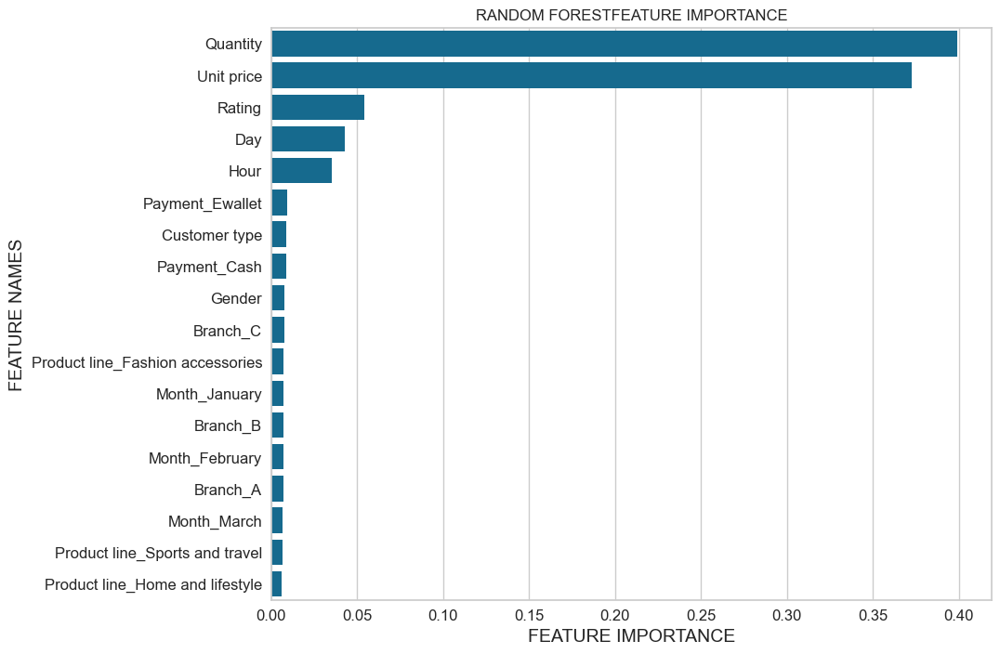

In [235]:
plot_feature_importance(rf3_result.best_estimator_.feature_importances_,X_train.columns,'RANDOM FOREST')

**Gradient Boosting Model**

In [236]:
from sklearn.ensemble import GradientBoostingRegressor
gbt = GradientBoostingRegressor(random_state=0)
model_gbt = gbt.fit(X_train,y_train)
y_pred_gbt = model_gbt.predict(X_test)
mse_gbt = mean_squared_error(y_test,y_pred_gbt)
print("GBT Model MSE:{}".format(mse_gbt))
gbt_rmse = np.sqrt(mse_gbt)
print("GBT Model RMSE:{}".format(gbt_rmse))
gbt_mae = mean_absolute_error(y_test,y_pred_gbt)
print("GBT Model MAE: {}".format(gbt_mae))

GBT Model MSE:138.3268735141084
GBT Model RMSE:11.761244556343023
GBT Model MAE: 8.833432058934038


In [237]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV
import pandas as pd
# Define the model
gbt = GradientBoostingRegressor(random_state=0)
# Define hyperparameters for tuning
parameters = {
    "learning_rate": [0.01, 0.025, 0.05],
    "max_depth": [3, 5, 8],
    "max_features": ["log2", "sqrt"],
    "n_estimators": [200, 500]
}
# Perform Grid Search
clf = GridSearchCV(estimator=gbt, param_grid=parameters, cv=10, verbose=1, n_jobs=-1)
gbt_result = clf.fit(X_train, y_train)
# Convert results to DataFrame
df_gbt = pd.DataFrame(clf.cv_results_)
print(df_gbt.head())  

Fitting 10 folds for each of 36 candidates, totalling 360 fits
   mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
0       0.330304      0.019725         0.006644        0.004746   
1       0.783212      0.051377         0.005793        0.000985   
2       0.302072      0.016040         0.004927        0.001162   
3       0.746474      0.037274         0.006048        0.001365   
4       0.392407      0.048676         0.004606        0.000888   

   param_learning_rate  param_max_depth param_max_features  \
0                 0.01                3               log2   
1                 0.01                3               log2   
2                 0.01                3               sqrt   
3                 0.01                3               sqrt   
4                 0.01                5               log2   

   param_n_estimators                                             params  \
0                 200  {'learning_rate': 0.01, 'max_depth': 3, 'max_f...   
1        

In [238]:
gbt_result.best_params_

{'learning_rate': 0.05,
 'max_depth': 3,
 'max_features': 'log2',
 'n_estimators': 500}

In [239]:
model_gbt2 = GradientBoostingRegressor(learning_rate=0.05,max_depth=3,max_features='log2',n_estimators=500)
model_gbt2.fit(X_train, y_train)
y_pred_gbt2 = model_gbt2.predict(X_test)
print("predicted value:",y_pred_gbt2)


predicted value: [525.56607006 375.98052221 350.74517614 321.36590912 200.57781856
  28.78533876 140.94055445  96.07805626 219.32314386 746.6445772
 347.98556924 676.35103242  18.75682687 692.49421604 293.02132082
 546.63909647 223.21396198 388.78659884 120.19551003 141.92043343
 269.48412941 409.98694181 193.60000376 150.90519593 701.37017244
 128.66883656 331.79499043  -2.28040624 104.12277706 331.3901784
  66.57232164 131.20717155 276.2460067  233.7666743  684.28939031
 606.44544794 734.72832442 818.54849745  78.38471876 629.09116359
 268.99192979 402.19584902 193.46317422 707.3231708  189.3987908
 137.70848907 180.94806279 135.84284882 -20.29900326 103.87137281
 207.50626304 373.90381351 159.11352877 106.82773648 605.21737362
 121.57057344 335.84466336 326.38755057 446.79163984 125.97271145
 726.82146275  95.01156726 464.3145611   68.7038941  -49.81937784
 324.56145886 277.89303422 337.11626037 563.66104802 429.66228926
  63.04311166 208.53610513 128.09834698  54.66871233 744.36343

**Feature Importance**

In [240]:
# Feature Importance
feature_importances_gbt = gbt_result.best_estimator_.feature_importances_
feature_importances_gbt

array([0.00068721, 0.00110024, 0.45990741, 0.48981126, 0.01502343,
       0.0094983 , 0.01026153, 0.00101372, 0.00080816, 0.00201027,
       0.00198884, 0.00058223, 0.0008503 , 0.00110698, 0.00217595,
       0.00122604, 0.0012686 , 0.00067955])

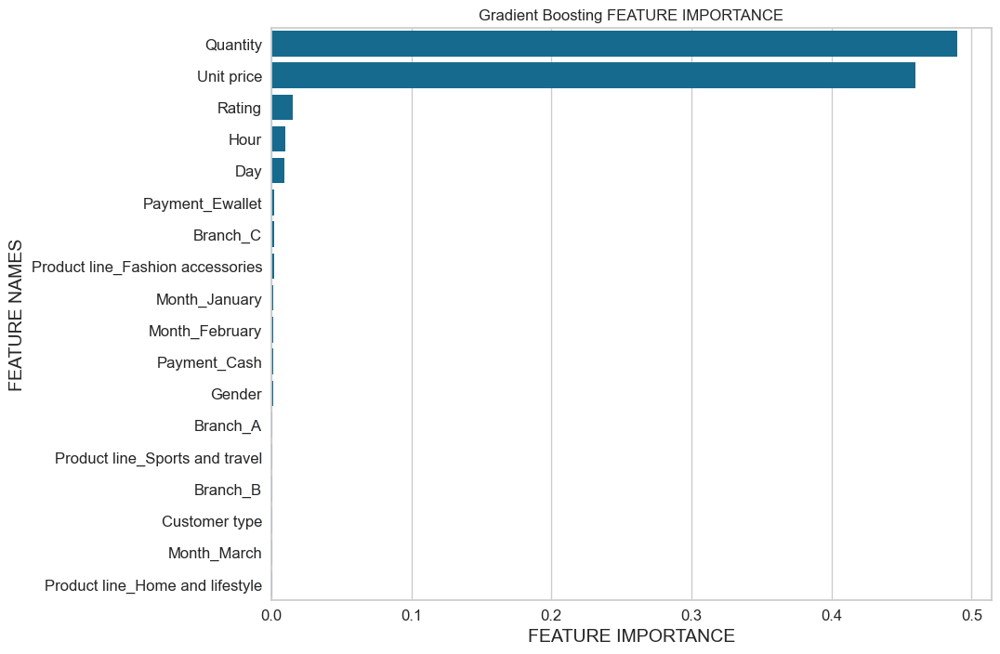

In [241]:
plot_feature_importance(gbt_result.best_estimator_.feature_importances_,X_train.columns,'Gradient Boosting ')

In [242]:
import xgboost
print(dir(xgboost))

['Booster', 'DMatrix', 'DataIter', 'ExtMemQuantileDMatrix', 'QuantileDMatrix', 'RabitTracker', 'XGBClassifier', 'XGBModel', 'XGBRFClassifier', 'XGBRFRegressor', 'XGBRanker', 'XGBRegressor', '__all__', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', '__version__', '_data_utils', '_py_version', '_typing', 'build_info', 'callback', 'collective', 'compat', 'config', 'config_context', 'core', 'cv', 'data', 'get_config', 'libpath', 'plot_importance', 'plot_tree', 'plotting', 'set_config', 'sklearn', 'to_graphviz', 'tracker', 'train', 'training']


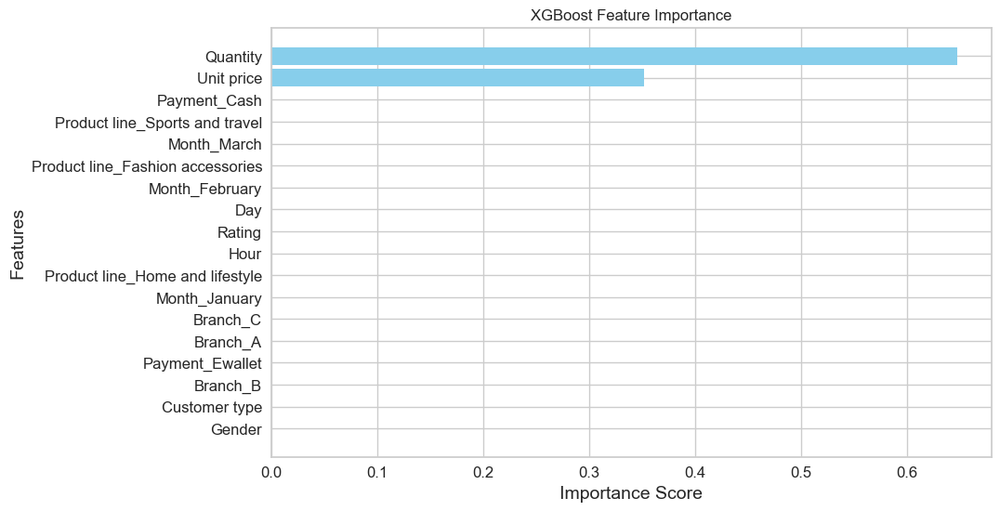

In [243]:
# Train XGBoost model
from xgboost import XGBRegressor
xgb_model = XGBRegressor(n_estimators=500, learning_rate=0.05, max_depth=5, random_state=42)
xgb_model.fit(X_train, y_train)

# Get feature importance
feature_importances_xgb = xgb_model.feature_importances_

# Convert to DataFrame for better visualization
importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances_xgb
}).sort_values(by="Importance", ascending=False)

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel("Importance Score")
plt.ylabel("Features")
plt.title("XGBoost Feature Importance")
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()

#ACCURACY RATE

In [244]:
from sklearn.model_selection import GridSearchCV

parameters = {
    "learning_rate": [0.01, 0.05, 0.1],
    "max_depth": [3, 5, 8],
    "max_features": ["log2", "sqrt"],
    "n_estimators": [200, 500, 1000]
}

grid_search = GridSearchCV(GradientBoostingRegressor(random_state=42), parameters, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best model
best_model = grid_search.best_estimator_
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

best_model.fit(X_train_scaled, y_train)
y_pred_gbt2 = best_model.predict(X_test_scaled)
mape_gbt2 = np.mean(np.abs((y_test - y_pred_gbt2) / y_test)) * 100
accuracy = 100 - mape_gbt2
print(f"GBT Model Accuracy: {accuracy:.2f}%")

GBT Model Accuracy: 85.59%


In [245]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Train XGBoost model
xgb_model = XGBRegressor(n_estimators=500, learning_rate=0.05, max_depth=5, random_state=42)
xgb_model.fit(X_train, y_train)

# Make predictions
y_pred_xgb = xgb_model.predict(X_test)

# Evaluate XGBoost model
def evaluate_model(y_test, y_pred, model_name):
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)  # Added MAE
    r2 = r2_score(y_test, y_pred)
    mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
    accuracy = 100 - mape

    print(f"{model_name} MSE: {mse:.4f}")
    print(f"{model_name} RMSE: {rmse:.4f}")
    print(f"{model_name} MAE: {mae:.4f}")  # Print MAE
    print(f"{model_name} R² Score: {r2:.4f} (closer to 1 is better)")
    print(f"{model_name} Accuracy (100 - MAPE): {accuracy:.2f}%")

evaluate_model(y_test, y_pred_xgb, "XGBoost")

XGBoost MSE: 41.5243
XGBoost RMSE: 6.4439
XGBoost MAE: 4.5710
XGBoost R² Score: 0.9993 (closer to 1 is better)
XGBoost Accuracy (100 - MAPE): 97.93%


In [246]:
#Summary of scores

df = {'Models': ["Linear Regression","Random Forest Regression","Gradient Boosting Classifier","XGBOOST"],
     'MSE': [6474.63,163.21,113.29,41.5243],
     'RMSE': [80.46,12.77,10.64,6.4439],
     'MAE': [31.61,8.46,7.50,4.57]}
summary = pd.DataFrame(df)

In [247]:
summary

,Models,MSE,RMSE,MAE
0,Linear Regression,6474.6300,80.4600,31.61
1,Random Forest Regression,163.2100,12.7700,8.46
2,Gradient Boosting Classifier,113.2900,10.6400,7.50
3,XGBOOST,41.5243,6.4439,4.57


Text(0, 0.5, 'Models')

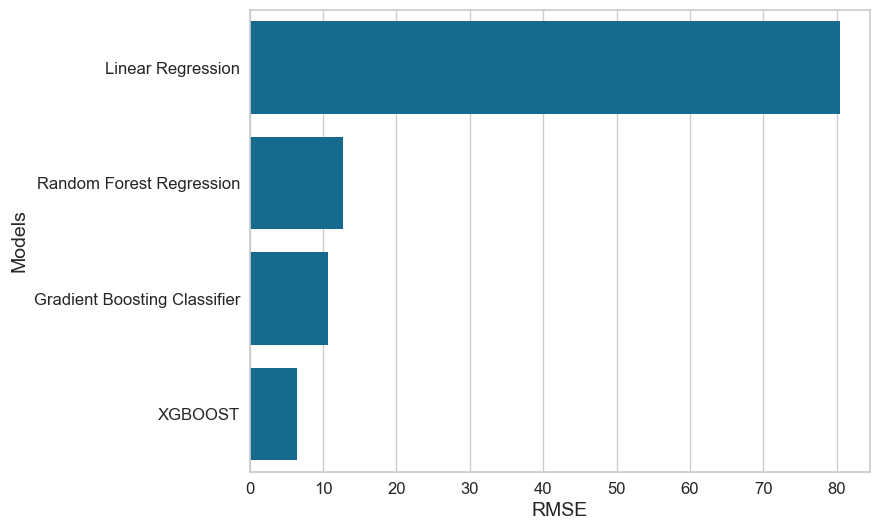

In [248]:
plt.figure(figsize=(8, 6))
splot=sns.barplot(x="RMSE",y="Models",data=summary)
plt.xlabel("RMSE", size=14)
plt.ylabel("Models", size=14)

# Causal Inference

In [249]:
pip install dowhy

Note: you may need to restart the kernel to use updated packages.


In [250]:
%pip install dowhy

Note: you may need to restart the kernel to use updated packages.


In [251]:
pip install -r requirements.txt

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'


In [252]:
import dowhy
from dowhy import CausalModel
import dowhy.datasets, dowhy.plotter
import dowhy.api
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

In [253]:
pip install graphviz

Note: you may need to restart the kernel to use updated packages.


**Creating Causal Models with Treatment and control features and target variable**

In [254]:
#Data Import

sales = pd.read_csv(r"supermarket_sales.csv")

In [255]:
# dealing with date and time

sales['Date'] = pd.to_datetime(sales['Date'])

sales['Day'] = (sales['Date']).dt.day
sales['Month'] = (sales['Date']).dt.month

sales['Month'] = sales['Month'].apply(lambda x: calendar.month_name[x])

sales['Time'] = pd.to_datetime(sales['Time'])
sales['Hour'] = (sales['Time']).dt.hour


C:\Users\rithi\AppData\Local\Temp\ipykernel_26368\3631809749.py:10: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  sales['Time'] = pd.to_datetime(sales['Time'])


In [256]:
# Removing variables from the data which don't have any predictive power

sales_df = sales.drop(columns=["Invoice ID","Date","Time","gross margin percentage"])

In [257]:
#Splitting Features into binary and categorical

binary_feature = sales_df.nunique()[sales_df.nunique() == 2].keys().tolist()

cat_feat = sales_df[["Branch","City","Customer type","Gender","Product line","Payment","Month"]]


In [258]:
# Feature Engineering by dummyfying the binary and categorical variables
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in binary_feature:
    sales_df[i] = le.fit_transform(sales_df[i])

In [259]:
sales_df = pd.get_dummies(sales_df)

In [260]:
sales_df.head()

,Customer type,Gender,Unit price,Quantity,Tax 5%,Total,cogs,gross income,Rating,Day,...,Product line_Food and beverages,Product line_Health and beauty,Product line_Home and lifestyle,Product line_Sports and travel,Payment_Cash,Payment_Credit card,Payment_Ewallet,Month_February,Month_January,Month_March
0,0,0,74.69,7,26.1415,548.9715,522.83,26.1415,9.1,5,...,False,True,False,False,False,False,True,False,True,False
1,1,0,15.28,5,3.8200,80.2200,76.40,3.8200,9.6,8,...,False,False,False,False,True,False,False,False,False,True
2,1,1,46.33,7,16.2155,340.5255,324.31,16.2155,7.4,3,...,False,False,True,False,False,True,False,False,False,True
3,0,1,58.22,8,23.2880,489.0480,465.76,23.2880,8.4,27,...,False,True,False,False,False,False,True,False,True,False
4,1,1,86.31,7,30.2085,634.3785,604.17,30.2085,5.3,8,...,False,False,False,True,False,False,True,True,False,False


In [261]:
sales_df.columns

Index(['Customer type', 'Gender', 'Unit price', 'Quantity', 'Tax 5%', 'Total',
       'cogs', 'gross income', 'Rating', 'Day', 'Hour', 'Branch_A', 'Branch_B',
       'Branch_C', 'City_Mandalay', 'City_Naypyitaw', 'City_Yangon',
       'Product line_Electronic accessories',
       'Product line_Fashion accessories', 'Product line_Food and beverages',
       'Product line_Health and beauty', 'Product line_Home and lifestyle',
       'Product line_Sports and travel', 'Payment_Cash', 'Payment_Credit card',
       'Payment_Ewallet', 'Month_February', 'Month_January', 'Month_March'],
      dtype='object')

In [262]:
corr = sales_df.corr()['Total'].sort_values()

# Display correlations
print('Top 10 - Positive Correlations:')
print('-----------------------------------')
print(corr.tail(10))
print('\nTop 10 - Negative Correlations:')
print('------------------------------')
print(corr.head(10))
print('------------------------------')
print(corr)

Top 10 - Positive Correlations:
-----------------------------------
Month_January                      0.022216
Product line_Home and lifestyle    0.024276
Branch_C                           0.040176
City_Naypyitaw                     0.040176
Unit price                         0.633962
Quantity                           0.705510
cogs                               1.000000
Tax 5%                             1.000000
gross income                       1.000000
Total                              1.000000
Name: Total, dtype: float64

Top 10 - Negative Correlations:
------------------------------
Gender                             -0.049451
Rating                             -0.036442
Product line_Fashion accessories   -0.033850
City_Yangon                        -0.030994
Branch_A                           -0.030994
Customer type                      -0.019670
Month_March                        -0.016846
Payment_Ewallet                    -0.012244
City_Mandalay                      -0.00

In [263]:
sales_df['Gender'] = sales_df['Gender'].apply(bool)
sales_df['Customer type'] = sales_df['Customer type'].apply(bool)

In [264]:
sales_df.dtypes

Customer type                             bool
Gender                                    bool
Unit price                             float64
Quantity                                 int64
Tax 5%                                 float64
Total                                  float64
cogs                                   float64
gross income                           float64
Rating                                 float64
Day                                      int32
Hour                                     int32
Branch_A                                  bool
Branch_B                                  bool
Branch_C                                  bool
City_Mandalay                             bool
City_Naypyitaw                            bool
City_Yangon                               bool
Product line_Electronic accessories       bool
Product line_Fashion accessories          bool
Product line_Food and beverages           bool
Product line_Health and beauty            bool
Product line_

***Assumptions:***

*Since we need to understand what drives the total sales of the company, I have taken the treatments such as customer type, gender, unit price, quantity, rating and hour, which may have correlations with the sales generation in a company.*


*Commom Causes: it represent the variables that according to us have a causal affect on both Outcome and Treatment, so based on my assumption, the common causes could include Branch, payment methods, month as well as product lines along with the treatment variables as mentioned above.*

*Refute: It reruns the analysis by adding randomly drawn covariates to data to check whether the causal estimate changes or not. If my assumption was correct then the causal effect after refutation will not change much as can be seen from the analysis below.*


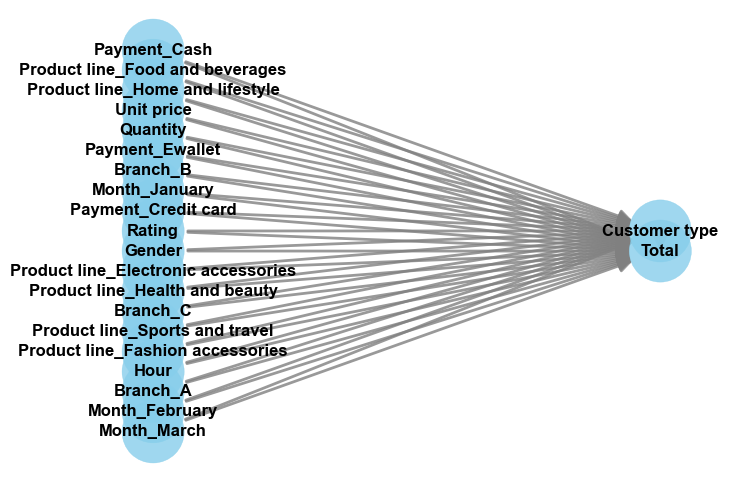

In [265]:
import pandas as pd
import numpy as np
import dowhy
from dowhy import CausalModel
import matplotlib.pyplot as plt

# Load or define your dataset (Ensure sales_df is properly formatted)
# Example: sales_df = pd.read_csv("sales_data.csv")

# Define the causal model
model1 = CausalModel(
    data=sales_df,
    treatment='Customer type',
    outcome="Total",
    common_causes=[
        'Gender', 'Unit price', 'Quantity', 'Rating', 'Hour',
        'Branch_A', 'Branch_B', 'Branch_C',
        'Product line_Electronic accessories', 'Product line_Fashion accessories',
        'Product line_Food and beverages', 'Product line_Health and beauty',
        'Product line_Home and lifestyle', 'Product line_Sports and travel',
        'Payment_Cash', 'Payment_Credit card', 'Payment_Ewallet',
        'Month_February', 'Month_January', 'Month_March'
    ],
    instruments=[]  # No instrumental variables in this case
)

# Visualize the causal graph
model1.view_model()



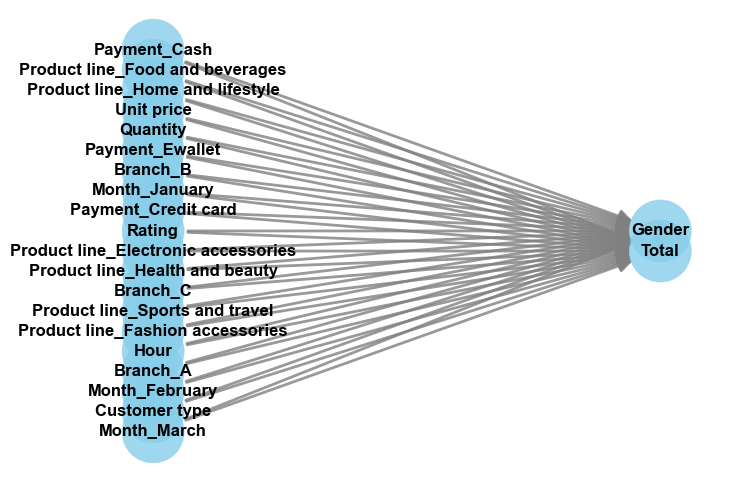

In [266]:
model2= CausalModel(
        data=sales_clean,
        treatment='Gender',
        outcome="Total",
        common_causes=['Customer type','Unit price','Quantity','Rating','Hour','Branch_A', 'Branch_B',
       'Branch_C','Product line_Electronic accessories',
       'Product line_Fashion accessories', 'Product line_Food and beverages',
       'Product line_Health and beauty', 'Product line_Home and lifestyle',
       'Product line_Sports and travel','Payment_Cash', 'Payment_Credit card',
       'Payment_Ewallet', 'Month_February', 'Month_January', 'Month_March'],instruments=[])
model2.view_model()

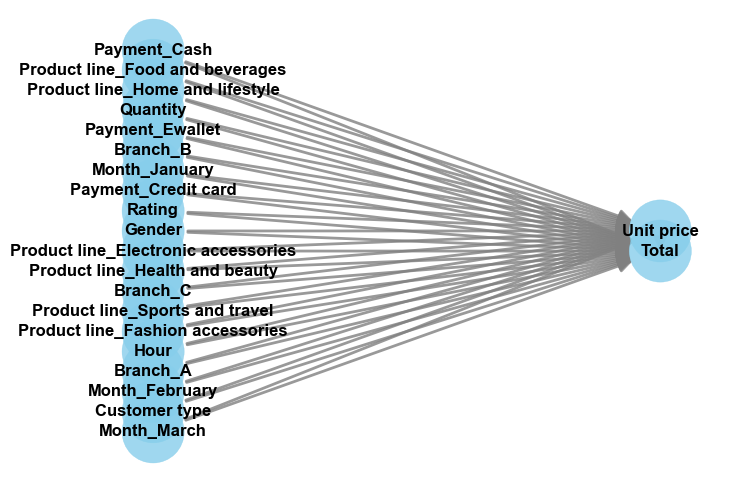

In [267]:
model3= CausalModel(
        data=sales_clean,
        treatment='Unit price',
        outcome="Total",
        common_causes=['Customer type','Gender','Quantity','Rating','Hour','Branch_A', 'Branch_B',
       'Branch_C','Product line_Electronic accessories',
       'Product line_Fashion accessories', 'Product line_Food and beverages',
       'Product line_Health and beauty', 'Product line_Home and lifestyle',
       'Product line_Sports and travel','Payment_Cash', 'Payment_Credit card',
       'Payment_Ewallet', 'Month_February', 'Month_January', 'Month_March'],
        instruments=[])
model3.view_model()

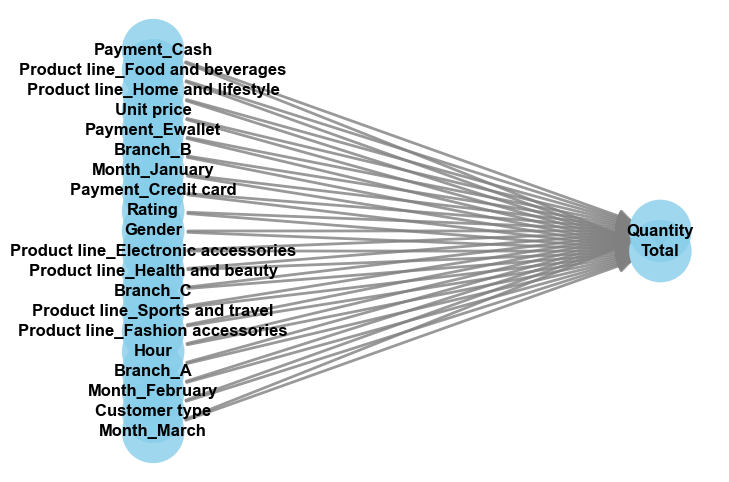

In [268]:
model4= CausalModel(
        data=sales_clean,
        treatment='Quantity',
        outcome="Total",
        common_causes=['Customer type','Gender','Unit price','Rating','Hour','Branch_A', 'Branch_B',
       'Branch_C','Product line_Electronic accessories',
       'Product line_Fashion accessories', 'Product line_Food and beverages',
       'Product line_Health and beauty', 'Product line_Home and lifestyle',
       'Product line_Sports and travel','Payment_Cash', 'Payment_Credit card',
       'Payment_Ewallet', 'Month_February', 'Month_January', 'Month_March'],
        instruments=[])
model4.view_model()

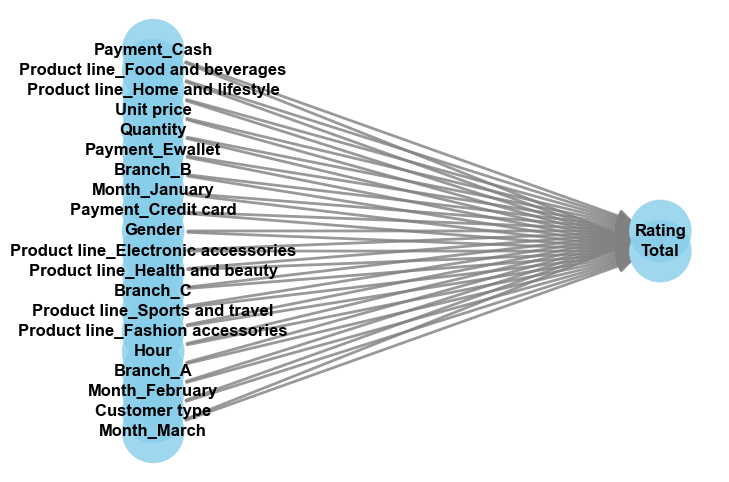

In [269]:
model5= CausalModel(
        data=sales_clean,
        treatment='Rating',
        outcome="Total",
        common_causes=['Customer type','Gender','Unit price','Quantity','Hour','Branch_A', 'Branch_B',
       'Branch_C','Product line_Electronic accessories',
       'Product line_Fashion accessories', 'Product line_Food and beverages',
       'Product line_Health and beauty', 'Product line_Home and lifestyle',
       'Product line_Sports and travel','Payment_Cash', 'Payment_Credit card',
       'Payment_Ewallet', 'Month_February', 'Month_January', 'Month_March'],
        instruments=[])
model5.view_model()

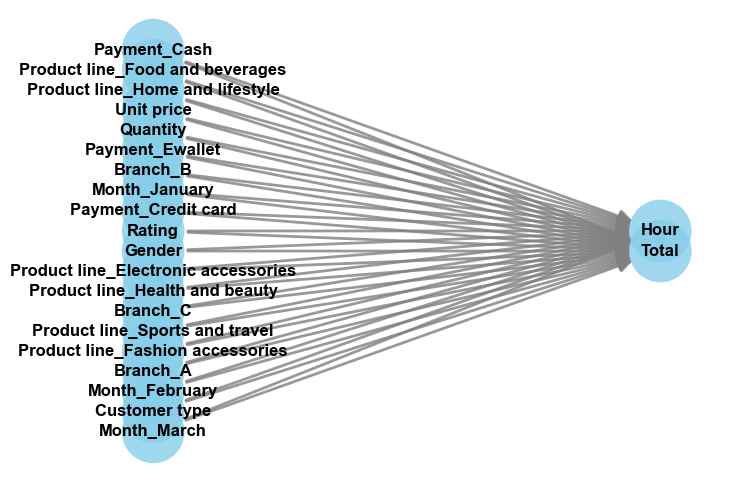

In [270]:
model6= CausalModel(
        data=sales_clean,
        treatment='Hour',
        outcome="Total",
        common_causes=['Customer type','Gender','Unit price','Quantity','Rating','Branch_A', 'Branch_B',
       'Branch_C','Product line_Electronic accessories',
       'Product line_Fashion accessories', 'Product line_Food and beverages',
       'Product line_Health and beauty', 'Product line_Home and lifestyle',
       'Product line_Sports and travel','Payment_Cash', 'Payment_Credit card',
       'Payment_Ewallet', 'Month_February', 'Month_January', 'Month_March'],
        instruments=[])
model6.view_model()

**ACCURACY**

In [271]:
summary

,Models,MSE,RMSE,MAE
0,Linear Regression,6474.6300,80.4600,31.61
1,Random Forest Regression,163.2100,12.7700,8.46
2,Gradient Boosting Classifier,113.2900,10.6400,7.50
3,XGBOOST,41.5243,6.4439,4.57


*From the causal inference models, it is clear that only Quantity, Unit price and Customer Type have the causal relationship with total sales as they have the significant positive causal effect on total sales and p-value for unit price and quantity are less than 0.001 but for customer type, the p-value was greater than 0.001. This implies that for 1 unit increase in the quantity and unit price the total sales should go up by 58.67 and 5.82 dollars which seems reasonable and quite realistic. Customer type is also one of the important factors to consider for sales generation, this implies that company should focus of converting their normal customers to members and offer better schemes to member customers in order to generate more sales.*


*The causual effect also displays that Cash Payment have significant negative causal effect on the total sales with p value less than 0.001 which implies that a 1 unit payment through cash may drop total sales by 58.95 dollars. It also shows that february month as well as e-wallet payments and products sold from Branch A have significantly negative causal effect on total sales with p-value less than 0.001.*